<a href="https://colab.research.google.com/github/manhalrahman/COVID-19-Forecasting/blob/main/Covid_Forecsasting_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Helper Functions

In [ ]:
#Converts index with dates to datetime and sets the frequency
def index_to_date(ser, f='D'):
    ser.index = pd.to_datetime(ser.index)
    ser.index.freq = f

In [ ]:
def daily_increase(data):
    inc = [] 
    for i in range(len(data)):
        if i == 0:
            inc.append(data[0])
        else:
            inc.append(data[i]-data[i-1])
    return inc 

In [ ]:
def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

In [ ]:
from statsmodels.tsa.stattools import adfuller
#Augmented Dickey-Fuller test
def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

### Importing Libraries and Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns

In [ ]:
data_cases = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")
data_dead = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv" )
data_recovered = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv")

In [ ]:
data_cases.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,10/4/20,10/5/20,10/6/20,10/7/20,10/8/20,10/9/20,10/10/20,10/11/20,10/12/20,10/13/20,10/14/20,10/15/20,10/16/20,10/17/20,10/18/20,10/19/20,10/20/20,10/21/20,10/22/20,10/23/20,10/24/20,10/25/20,10/26/20,10/27/20,10/28/20,10/29/20,10/30/20,10/31/20,11/1/20,11/2/20,11/3/20,11/4/20,11/5/20,11/6/20,11/7/20,11/8/20,11/9/20,11/10/20,11/11/20,11/12/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,39341,39422,39486,39548,39616,39693,39703,39799,39870,39928,39994,40026,40073,40141,40200,40287,40357,40510,40626,40687,40768,40833,40937,41032,41145,41268,41334,41425,41501,41633,41728,41814,41935,41975,42033,42092,42297,42463,42609,42795
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,14266,14410,14568,14730,14899,15066,15231,15399,15570,15752,15955,16212,16501,16774,17055,17350,17651,17948,18250,18556,18858,19157,19445,19729,20040,20315,20634,20875,21202,21523,21904,22300,22721,23210,23705,24206,24731,25294,25801,26211
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,52136,52270,52399,52520,52658,52804,52940,53072,53325,53399,53584,53777,53998,54203,54402,54616,54829,55081,55357,55630,55880,56143,56419,56706,57026,57332,57651,57942,58272,58574,58979,59527,60169,60800,61381,62051,62693,63446,64257,65108
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2110,2370,2370,2568,2568,2696,2696,2696,2995,2995,3190,3190,3377,3377,3377,3623,3623,3811,3811,4038,4038,4038,4325,4410,4517,4567,4665,4756,4825,4888,4910,5045,5135,5135,5319,5383,5437,5477,5567,5616
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,5402,5530,5725,5725,5958,6031,6246,6366,6488,6680,6846,7096,7222,7462,7622,7829,8049,8338,8582,8829,9026,9381,9644,9871,10074,10269,10558,10805,11035,11228,11577,11813,12102,12223,12335,12433,12680,12816,12953,13053


In [ ]:
print(data_cases.shape,data_dead.shape,data_recovered.shape) 

(269, 300) (269, 300) (256, 300)


In [ ]:
df = data_cases.groupby('Country/Region').sum()
df_dead = data_dead.groupby('Country/Region').sum()
df_recovered = data_recovered.groupby('Country/Region').sum()

In [ ]:
print(df.shape,df_dead.shape,df_recovered.shape) 

(191, 298) (191, 298) (191, 298)


In [ ]:
time_series = df.loc[:,"1/22/20":]
time_series_dead = df_dead.loc[:,"1/22/20":]
time_series_recovered = df_recovered.loc[:,"1/22/20":]


In [ ]:
time_series.style.background_gradient(cmap ='Reds')

### Preparing Dataset 
<i> India and Global </i>

In [ ]:
Global = time_series[:].sum()
Global_train = Global[:(len(Global.index)-30)]
Global_test = Global[(len(Global.index)-30):]

India = time_series.loc['India']
India_train = India[:(len(Global.index)-30)]
India_test = India[(len(Global.index)-30):]

In [ ]:
total_cases_country = df.loc[:,df.columns[-1]]
top5 = total_cases_country.sort_values()[-5:]
bottom5 = total_cases_country.sort_values()[:5]

In [ ]:
total_cases_country[total_cases_country == 0] 

Series([], Name: 11/12/20, dtype: int64)

### Exploratory Data Analysis

Text(0, 0.5, 'cases')

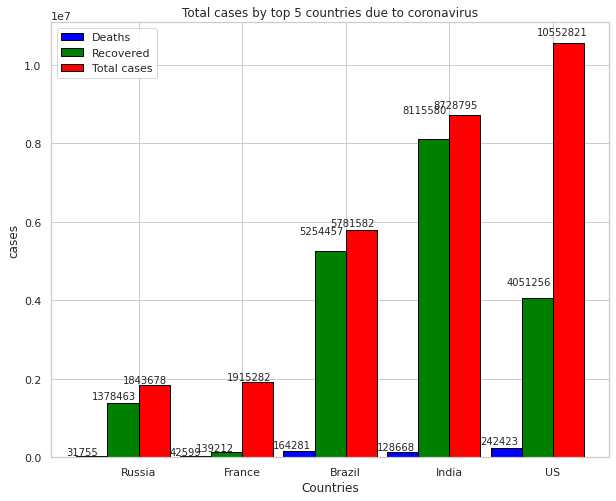

In [ ]:
sns.set()
sns.set_style("whitegrid")

plt.figure(figsize = (10,8))

plt.bar(np.arange(5)-0.3  , time_series_dead.loc[top5.index][df.columns[-1]].values ,width= 0.3, align='center',color='blue', edgecolor = 'black')
plt.bar(np.arange(5)  , time_series_recovered.loc[top5.index][df.columns[-1]].values, width= 0.3, align='center',color='green', edgecolor = 'black')
plt.bar(np.arange(5)+0.3, top5.values, width= 0.3, align='center',color='red', edgecolor = 'black')

for i in range(5):
    plt.annotate(top5[i],(  i, top5[i]*1.02), fontsize =10)
    plt.annotate(time_series_recovered.loc[top5.index][df.columns[-1]][i], (  -0.3 + i, time_series_recovered.loc[top5.index][df.columns[-1]][i]*1.08), fontsize = 10)
    plt.annotate(time_series_dead.loc[top5.index][df.columns[-1]][i], (-0.55 +  i, time_series_dead.loc[top5.index][df.columns[-1]][i]*1.4), fontsize = 10)

plt.legend(labels = ['Deaths','Recovered','Total cases'])
plt.title("Total cases by top 5 countries due to coronavirus")
plt.xlabel('Countries')
plt.xticks(np.arange(5) + 0.3/ 2, top5.index)
plt.ylabel('cases')




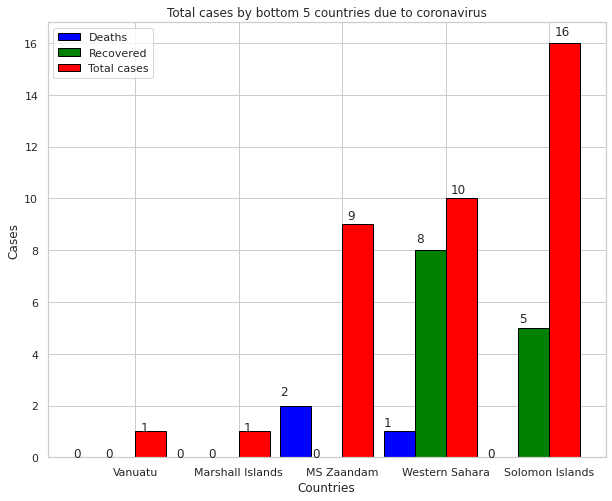

In [ ]:
sns.set()
sns.set_style("whitegrid")

plt.figure(figsize= (10,8))

plt.bar(np.arange(5)-0.3  , time_series_dead.loc[bottom5.index][df.columns[-1]].values ,width= 0.3, align='center',color='blue', edgecolor = 'black')
plt.bar(np.arange(5)  , time_series_recovered.loc[bottom5.index][df.columns[-1]].values, width= 0.3, align='center',color='green', edgecolor = 'black')
plt.bar(np.arange(5)+0.3, bottom5.values, width= 0.3, align='center',color='red', edgecolor = 'black')

for i in range(5):
    plt.annotate(bottom5[i], ( 0.2 + i, bottom5[i]*1.02))
    plt.annotate(time_series_recovered.loc[bottom5.index][df.columns[-1]][i], ( -0.14 + i, time_series_recovered.loc[bottom5.index][df.columns[-1]][i]*1.04))
    plt.annotate(time_series_dead.loc[bottom5.index][df.columns[-1]][i], (-0.45 +  i, time_series_dead.loc[bottom5.index][df.columns[-1]][i]*1.2))

plt.legend(labels = ['Deaths','Recovered','Total cases'])
plt.title("Total cases by bottom 5 countries due to coronavirus")
plt.xlabel('Countries')
plt.ylabel('Cases')
plt.xticks(np.arange(5) + 0.3/ 2, bottom5.index)
plt.show()

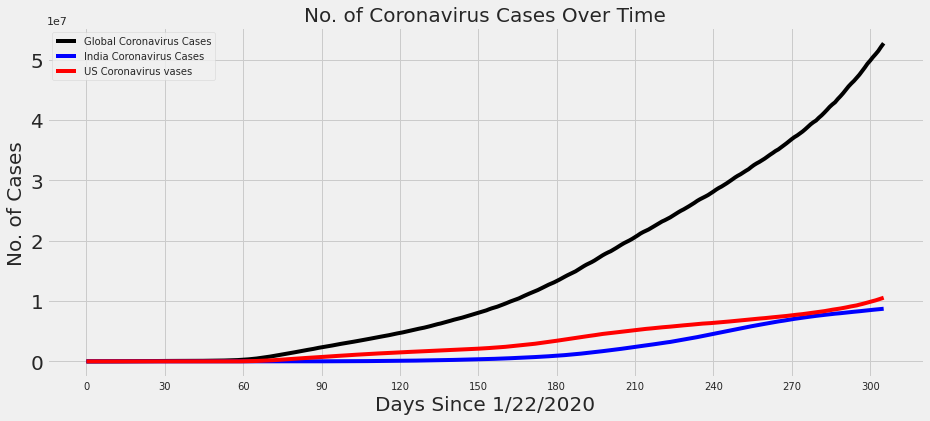

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, Global.values,color = 'black')

plt.plot(  India.index, India.values , color='blue')
plt.plot( Global.index, time_series.loc['US'].values, color ='red')

plt.title('No. of Coronavirus Cases Over Time', size=20)
plt.xlabel('Days Since 1/22/2020', size=20)
plt.ylabel('No. of Cases', size=20)
plt.legend(['Global Coronavirus Cases', 'India Coronavirus Cases','US Coronavirus vases'], prop={'size': 10})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=10)
plt.yticks(size=20)
plt.show()

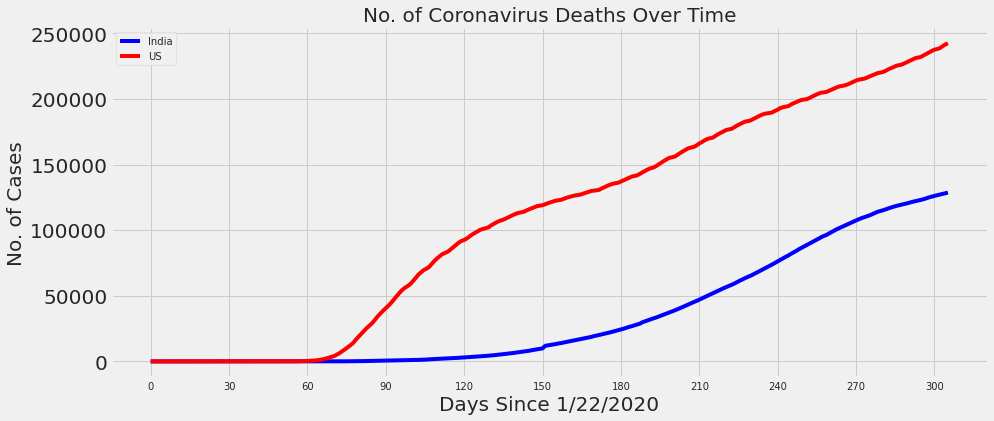

In [ ]:
 
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
\

plt.plot(  India.index, time_series_dead.loc['India'].values , color='blue')
plt.plot( Global.index, time_series_dead.loc['US'].values, color ='red')

plt.title('No. of Coronavirus Deaths Over Time', size=20)
plt.xlabel('Days Since 1/22/2020', size=20)
plt.ylabel('No. of Cases', size=20)
plt.legend(['India','US'], prop={'size': 10})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=10)
plt.yticks(size=20)
plt.show()

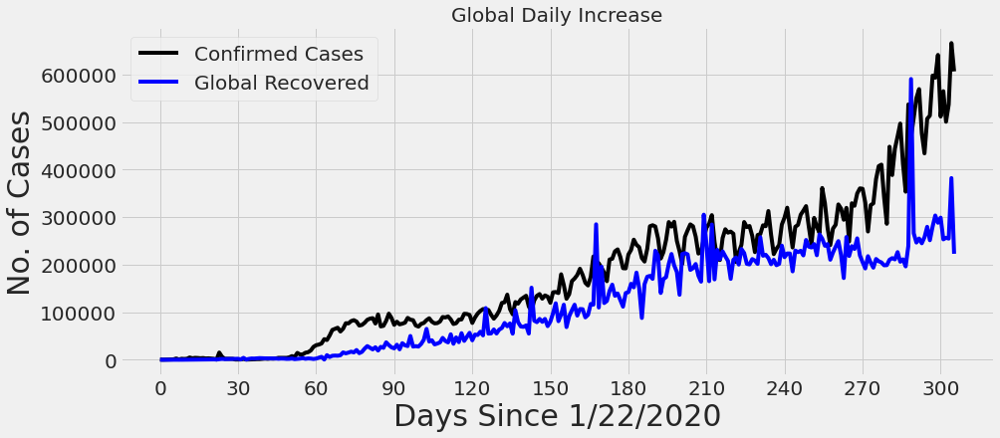

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, daily_increase(Global),color = 'black')
plt.plot(Global.index, daily_increase(time_series_recovered.sum()),color = 'blue')
#plt.plot(Global.index, daily_increase(time_series_dead.sum()),color = 'red')

plt.title('Global Daily Increase', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['Confirmed Cases', 'Global Recovered'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20)
plt.show()

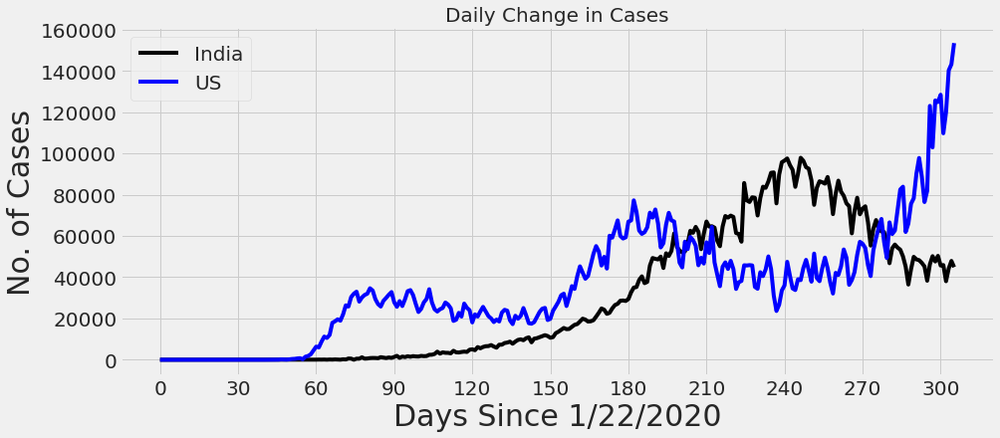

In [ ]:
 
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, daily_increase(India),color = 'black')
plt.plot(Global.index, daily_increase(time_series.loc['US'].values),color = 'blue')


plt.title('Daily Change in Cases', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['India', 'US'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20)
plt.show()

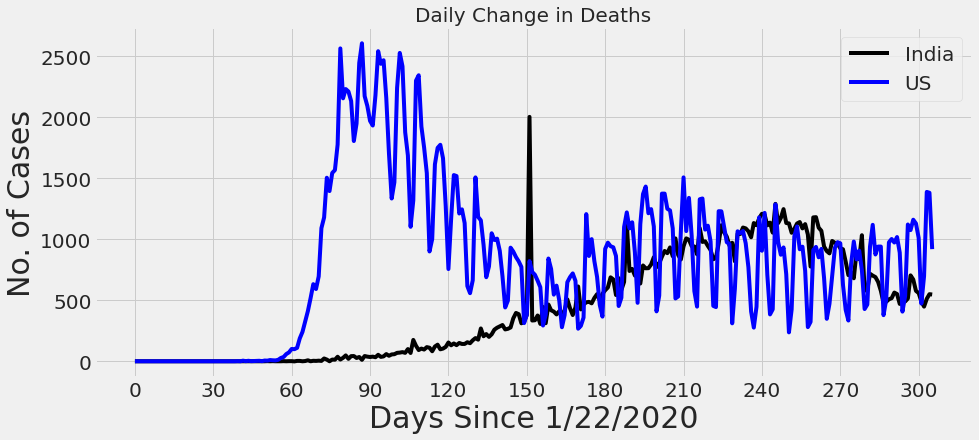

In [ ]:
 plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, daily_increase(time_series_dead.loc['India'].values),color = 'black')
plt.plot(Global.index, daily_increase(time_series_dead.loc['US'].values),color = 'blue')


plt.title('Daily Change in Deaths', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['India', 'US'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20)
plt.show()

In [ ]:
inc_case = []
inc_death = []
inc_recovered = []
for i in top5.index:
  inc_case.append(max(daily_increase(time_series.loc[i])))
  inc_death.append(max(daily_increase(time_series_dead.loc[i])))
  inc_recovered.append(max(daily_increase(time_series_recovered.loc[i])))

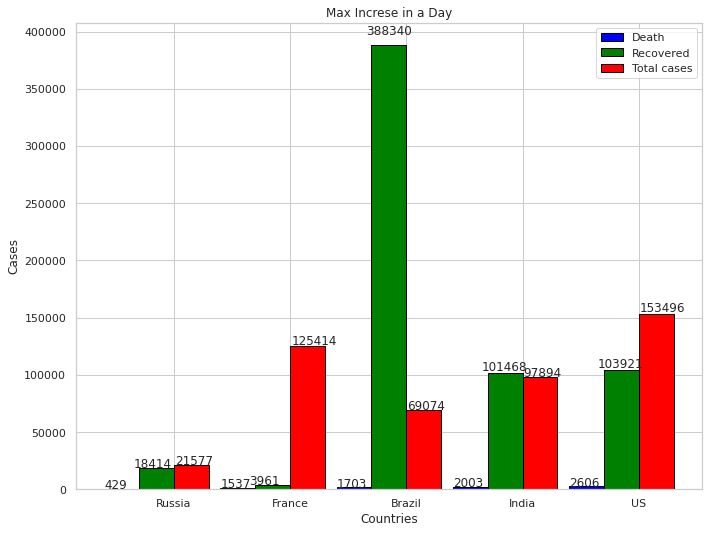

In [ ]:
sns.set()
sns.set_style("whitegrid")

plt.figure(figsize= (10,8))

plt.bar(np.arange(5)-0.3  , inc_death ,width= 0.3, align='center',color='blue', edgecolor = 'black')
plt.bar(np.arange(5)  , inc_recovered, width= 0.3, align='center',color='green', edgecolor = 'black')
plt.bar(np.arange(5) + 0.3, inc_case, width= 0.3, align='center',color='red', edgecolor = 'black')

for i in range(5):
    plt.annotate(inc_case[i], ( 0.16 + i, inc_case[i]*1.01))
    plt.annotate(inc_death[i], ( -0.45 + i, inc_death[i]*1.02))
    plt.annotate(inc_recovered[i], ( -0.2 + i, inc_recovered[i]*1.023))

plt.legend(labels = ['Death','Recovered','Total cases'])
plt.title("Max Increse in a Day")
plt.xlabel('Countries')
plt.ylabel('Cases')
plt.xticks(np.arange(5) + 0.3/ 2, top5.index)
plt.show()

## Moving Average

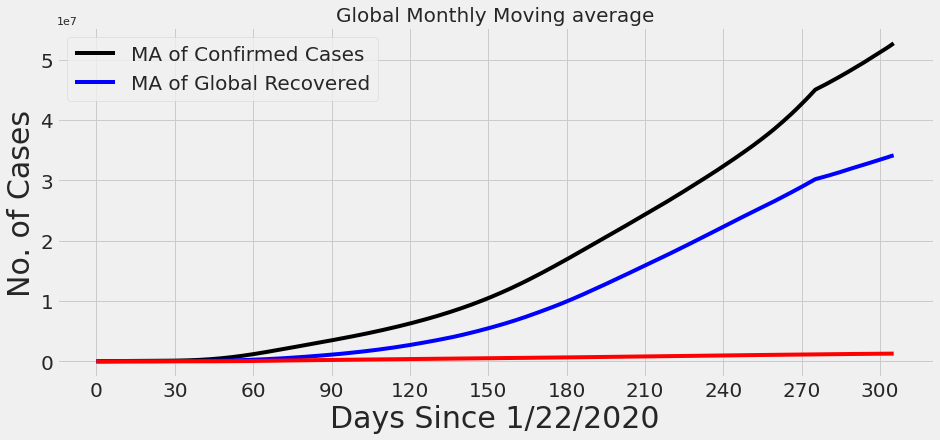

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, moving_average(Global,30),color = 'black')
plt.plot(Global.index, moving_average(time_series_recovered.sum(),30),color = 'blue')
plt.plot(Global.index, moving_average(time_series_dead.sum(),30),color = 'red')

plt.title('Global Monthly Moving average', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['MA of Confirmed Cases', 'MA of Global Recovered'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20);

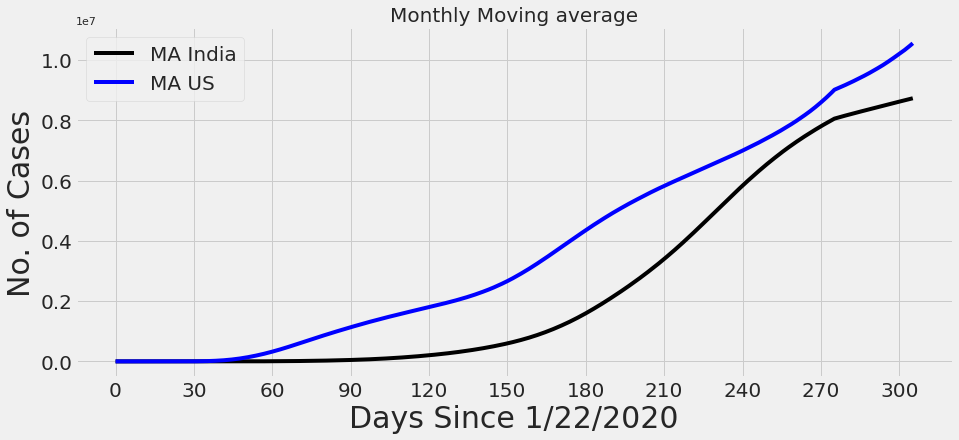

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, moving_average(India,30),color = 'black')
plt.plot(Global.index, moving_average(time_series.loc['US'].values,30),color = 'blue')

plt.title('Monthly Moving average', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['MA India', 'MA US'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20);

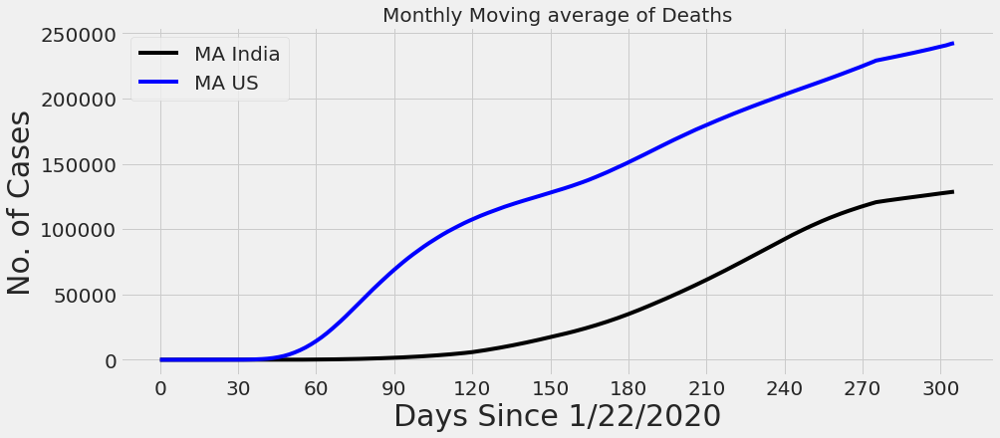

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global.index, moving_average(time_series_dead.loc['India'].values,30),color = 'black')
plt.plot(Global.index, moving_average(time_series_dead.loc['US'].values,30),color = 'blue')


plt.title('Monthly Moving average of Deaths', size=20)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['MA India', 'MA US'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(0,290,11).astype(int)], np.linspace(0,300,11).astype(int) ,size=20)

plt.yticks(size=20);

# Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [ ]:
model_NB = GaussianNB()
model_NB.fit( np.arange(len(Global_train.index)).reshape(-1,1), Global_train.values)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
NB_Global = model_NB.predict(np.linspace(len(Global_train.index),len(Global.index)-1,30).reshape(-1,1))


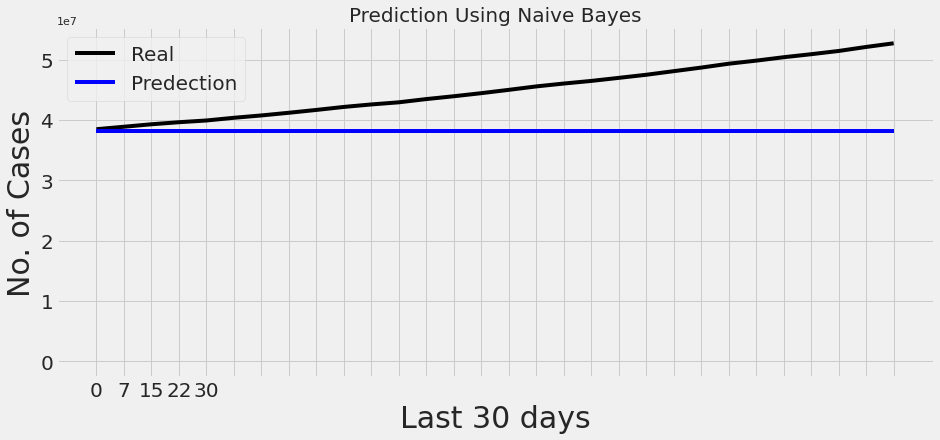

In [ ]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(14, 6))
plt.plot(Global_test.index, Global_test.values,color = 'black')
plt.plot(Global_test.index, NB_Global.reshape(-1,1),30,color = 'blue')

plt.title('Prediction Using Naive Bayes', size=20)
plt.xlabel('Last 30 days', size=30)
plt.ylabel('No. of Cases', size=30)
plt.legend(['Real', 'Predection'], prop={'size': 20})
plt.xticks(Global.index[np.linspace(len(Global_train.index),len(Global.index)-1,30).astype(int)], np.linspace(0,30,5).astype(int) ,size=20)

plt.yticks(size=20);

# ARIMA 

#### Adjusting index to datetime

In [ ]:
Global_train

1/22/20          555
1/23/20          654
1/24/20          941
1/25/20         1434
1/26/20         2118
              ...   
10/9/20     36856619
10/10/20    37187024
10/11/20    37456778
10/12/20    37781897
10/13/20    38110901
Length: 266, dtype: int64

In [ ]:
Global_train.index = pd.to_datetime(Global_train.index)

In [ ]:
Global_test.index = pd.to_datetime(Global_test.index)

#### Setting frequency for the index

In [ ]:
Global_train.index.freq = 'D'

In [ ]:
Global_test.index.freq = 'D'

In [ ]:
Global_train

2020-01-22         555
2020-01-23         654
2020-01-24         941
2020-01-25        1434
2020-01-26        2118
                ...   
2020-10-09    36856619
2020-10-10    37187024
2020-10-11    37456778
2020-10-12    37781897
2020-10-13    38110901
Freq: D, Length: 266, dtype: int64

In [ ]:
Global_test

2020-10-14    38490953
2020-10-15    38898224
2020-10-16    39308667
2020-10-17    39649909
2020-10-18    39935847
2020-10-19    40383933
2020-10-20    40772455
2020-10-21    41216105
2020-10-22    41685750
2020-10-23    42182515
2020-10-24    42595348
2020-10-25    42948826
2020-10-26    43485889
2020-10-27    43954797
2020-10-28    44463732
2020-10-29    45014520
2020-10-30    45583754
2020-10-31    46060084
2020-11-01    46494219
2020-11-02    47001076
2020-11-03    47514619
2020-11-04    48112246
2020-11-05    48705471
2020-11-06    49346623
2020-11-07    49858197
2020-11-08    50423019
2020-11-09    50923663
2020-11-10    51460740
2020-11-11    52126793
2020-11-12    52733290
Freq: D, dtype: int64

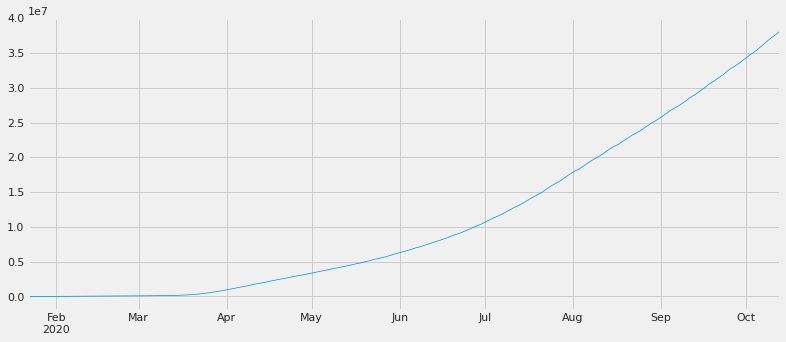

In [ ]:
Global_train.plot(figsize=(12,5), linewidth=0.7)

## Using Statsmodels to get the trend
<div class="alert alert-info"><h3>Related Function:</h3>
<tt><a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.filters.hp_filter.hpfilter.html'><strong>statsmodels.tsa.filters.hp_filter.hpfilter</strong></a><font color=black>(X, lamb=1600)</font>&nbsp;&nbsp;Hodrick-Prescott filter</div>
    
The <a href='https://en.wikipedia.org/wiki/Hodrick%E2%80%93Prescott_filter'>Hodrick-Prescott filter</a> separates a time-series  $y_t$ into a trend component $\tau_t$ and a cyclical component $c_t$

$y_t = \tau_t + c_t$

The components are determined by minimizing the following quadratic loss function, where $\lambda$ is a smoothing parameter:

$\min_{\\{ \tau_{t}\\} }\sum_{t=1}^{T}c_{t}^{2}+\lambda\sum_{t=1}^{T}\left[\left(\tau_{t}-\tau_{t-1}\right)-\left(\tau_{t-1}-\tau_{t-2}\right)\right]^{2}$


The $\lambda$ value above handles variations in the growth rate of the trend component.<br>When analyzing quarterly data, the default lambda value of 1600 is recommended. Use 6.25 for annual data, 1.109e11 for daily data and 129,600 for monthly data.
    

In [ ]:
lamb = 1.109306289e11

In [ ]:
lamb

110930628900.0

In [ ]:
from statsmodels.tsa.filters.hp_filter import hpfilter

In [ ]:
global_cycle, global_trend = hpfilter(Global_train, lamb = lamb)

In [ ]:
global_cycle

2020-01-22    7.684182e+06
2020-01-23    7.543143e+06
2020-01-24    7.402293e+06
2020-01-25    7.261648e+06
2020-01-26    7.121194e+06
                  ...     
2020-10-09    7.700242e+06
2020-10-10    7.889485e+06
2020-10-11    8.018077e+06
2020-10-12    8.202034e+06
2020-10-13    8.389876e+06
Freq: D, Name: cycle, Length: 266, dtype: float64

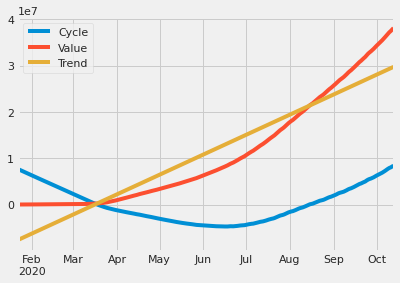

In [ ]:
global_cycle.plot(label='Cycle')
Global_train.plot(label='Value')
global_trend.plot(label='Trend')
plt.legend()

In [ ]:
global_df = pd.concat([Global_train, global_trend, global_cycle], axis=1)

In [ ]:
global_df.columns = ['Values', 'Trend', 'Cycle']

In [ ]:
global_df

,Values,Trend,Cycle
2020-01-22,555,-7.683627e+06,7.684182e+06
2020-01-23,654,-7.542489e+06,7.543143e+06
2020-01-24,941,-7.401352e+06,7.402293e+06
2020-01-25,1434,-7.260214e+06,7.261648e+06
2020-01-26,2118,-7.119076e+06,7.121194e+06
...,...,...,...
2020-10-09,36856619,2.915638e+07,7.700242e+06
2020-10-10,37187024,2.929754e+07,7.889485e+06
2020-10-11,37456778,2.943870e+07,8.018077e+06
2020-10-12,37781897,2.957986e+07,8.202034e+06


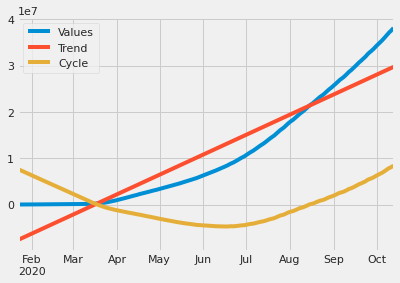

In [ ]:
global_df.plot()

# Tests for Stationarity
A time series is <em>stationary</em> if the mean and variance are fixed between any two equidistant points. That is, no matter where you take your observations, the results should be the same. A times series that shows seasonality is <em>not</em> stationary.

A test for stationarity usually involves a <a href='https://en.wikipedia.org/wiki/Unit_root_test'>unit root</a> hypothesis test, where the null hypothesis $H_0$ is that the series is <em>nonstationary</em>, and contains a unit root. The alternate hypothesis $H_1$ supports stationarity. The <a href='https://en.wikipedia.org/wiki/Augmented_Dickey-Fuller_test'>augmented Dickey-Fuller</a> and <a href='https://en.wikipedia.org/wiki/KPSS_test'>Kwiatkowski-Phillips-Schmidt-Shin</a> tests are stationarity tests. 

## Augmented Dickey-Fuller Test
To determine whether a series is stationary we can use the <a href='https://en.wikipedia.org/wiki/Augmented_Dickey-Fuller_test'>augmented Dickey-Fuller Test</a>. In this test the null hypothesis states that $\phi = 1$ (this is also called a unit test). The test returns several statistics we'll see in a moment. Our focus is on the p-value. A small p-value ($p<0.05$) indicates strong evidence against the null hypothesis.

In [ ]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

# ARMA(p,q) and ARIMA(p,d,q)
# Autoregressive Moving Averages

Recall that an <strong>AR(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \varepsilon_{t}$

while an <strong>MA(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = \mu + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

where $c$ is a constant, $\mu$ is the expectation of $y_{t}$ (often assumed to be zero), $\phi_1$ (phi-sub-one) is the AR lag coefficient, $\theta_1$ (theta-sub-one) is the MA lag coefficient, and $\varepsilon$ (epsilon) is white noise.

An <strong>ARMA(1,1)</strong> model therefore follows

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

ARMA models can be used on stationary datasets.

For non-stationary datasets with a trend component, ARIMA models apply a differencing coefficient as well.

<div class="alert alert-info"><h3>Related Functions:</h3>
<tt><strong>
<a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.arima_model.ARMA.html'>arima_model.ARMA</a></strong><font color=black>(endog, order[, exog, …])</font>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Autoregressive Moving Average ARMA(p,q) model<br>
<strong>
<a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.arima_model.ARMAResults.html'>arima_model.ARMAResults</a></strong><font color=black>(model, params[, …])</font>&nbsp;&nbsp;&nbsp;Class to hold results from fitting an ARMA model<br>
<strong>
<a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.arima_model.ARIMA.html'>arima_model.ARIMA</a></strong><font color=black>(endog, order[, exog, …])</font>&nbsp;&nbsp;&nbsp;&nbsp;Autoregressive Integrated Moving Average ARIMA(p,d,q) model<br>
<strong>
<a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.arima_model.ARIMAResults.html'>arima_model.ARIMAResults</a></strong><font color=black>(model, params[, …])</font>&nbsp;&nbsp;Class to hold results from fitting an ARIMA model<br>	
<strong>
<a href='https://www.statsmodels.org/stable/generated/statsmodels.tsa.kalmanf.kalmanfilter.KalmanFilter.html'>kalmanf.kalmanfilter.KalmanFilter</a></strong>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Kalman Filter code intended for use with the ARMA model</tt>

<h3>For Further Reading:</h3>
<strong>
<a href='https://en.wikipedia.org/wiki/Autoregressive%E2%80%93moving-average_model'>Wikipedia</a></strong>&nbsp;&nbsp;<font color=black>Autoregressive–moving-average model</font><br>
<strong>
<a href='https://otexts.com/fpp2/non-seasonal-arima.html'>Forecasting: Principles and Practice</a></strong>&nbsp;&nbsp;<font color=black>Non-seasonal ARIMA models</font></div>

In [ ]:
# !pip install pmdarima

In [ ]:
from statsmodels.tsa.ar_model import AR,ARResults
from statsmodels.tsa.arima_model import ARMA,ARMAResults,ARIMA,ARIMAResults
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf # for determining (p,q) orders
from pmdarima import auto_arima # for determining ARIMA orders

In [ ]:
adf_test(global_df['Values'])

Augmented Dickey-Fuller Test: 
ADF test statistic        0.531354
p-value                   0.985796
# lags used              16.000000
# observations          249.000000
critical value (1%)      -3.456888
critical value (5%)      -2.873219
critical value (10%)     -2.572994
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [ ]:
auto_arima(global_df['Values'],seasonal=True).summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmo

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  266
Model:               SARIMAX(5, 2, 2)   Log Likelihood               -2885.390
Date:                Fri, 13 Nov 2020   AIC                           5786.780
Time:                        18:19:48   BIC                           5815.388
Sample:                             0   HQIC                          5798.276
                                - 266                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3815      0.093      4.119      0.000       0.200       0.563
ar.L2         -0.6068      0.058    -10.516      0.000      -0.720      -0.494
ar.L3         -0.3154      0.073     -4.344      0.000      -0.458      -0.173
ar.L4         -0.3081      0.060     -5.173      0.000      -0.425      -0.191
ar.L5         -0.2909      0.082     -3.528      0.000      -0.453      -0.129
ma.L1         -1.1088      0.064    -17.385      0.000      -1.234      -0.984
ma.L2          0.8528      0.056     15.188      0.000       0.743       0.963
sigma2        2.3e+08   2.53e-10   9.09e+17      0.000     2.3e+08     2.3e+08
===================================================================================
Ljung-Box (Q):                      115.82   Jarque-Bera (JB):               244.83
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               8.89   Skew:                             0.78
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.68e+35. Standard errors may be unstable.
"""

# SARIMA(p,d,q)(P,D,Q)m
# Seasonal Autoregressive Integrated Moving Averages
Where ARIMA accepts the parameters $(p,d,q)$, SARIMA accepts an <em>additional</em> set of parameters $(P,D,Q)m$ that specifically describe the seasonal components of the model. Here $P$, $D$ and $Q$ represent the seasonal regression, differencing and moving average coefficients, and $m$ represents the number of data points (rows) in each seasonal cycle.

<strong>NOTE:</strong> The statsmodels implementation of SARIMA is called SARIMAX. The “X” added to the name means that the function also supports <em>exogenous</em> regressor variables.


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

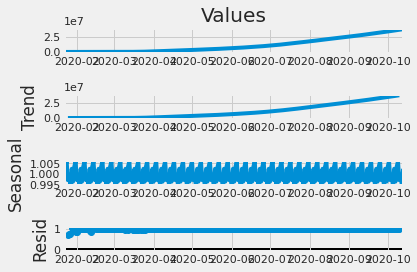

In [ ]:
result = seasonal_decompose(global_df['Values'], model='mul')
result.plot();

In [ ]:
auto_arima(global_df['Values'], seasonal=True, m=7).summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmo

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  266
Model:             SARIMAX(5, 2, 3)x(2, 0, [1], 7)   Log Likelihood               -2863.673
Date:                             Fri, 13 Nov 2020   AIC                           5751.346
Time:                                     18:21:56   BIC                           5794.257
Sample:                                          0   HQIC                          5768.589
                                             - 266                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2561      0.472      0.543      0.587      -0.668       1.181
ar.L2         -0.4347      0.288     -1.507      0.132      -1.000       0.131
ar.L3         -0.4384      0.238     -1.842      0.066      -0.905       0.028
ar.L4         -0.2856      0.132     -2.156      0.031      -0.545      -0.026
ar.L5         -0.2806      0.164     -1.710      0.087      -0.602       0.041
ma.L1         -0.9768      0.478     -2.043      0.041      -1.914      -0.040
ma.L2          0.6281      0.601      1.045      0.296      -0.550       1.806
ma.L3          0.1929      0.443      0.436      0.663      -0.675       1.061
ar.S.L7        0.6445      0.235      2.743      0.006       0.184       1.105
ar.S.L14       0.2014      0.132      1.528      0.126      -0.057       0.460
ma.S.L7       -0.4617      0.236     -1.957      0.050      -0.924       0.001
sigma2      2.156e+08   6.54e-09    3.3e+16      0.000    2.16e+08    2.16e+08
===================================================================================
Ljung-Box (Q):                       51.25   Jarque-Bera (JB):               161.66
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               8.47   Skew:                             0.67
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.44e+32. Standard errors may be unstable.
"""

This provides an ARIMA Order of (5,2,3) combined with a seasonal order of (1,0,[1, 2],7) Now let's train & test the SARIMAX(5,2,3)(1,0,[1, 2],7) model, evaluate it, then produce a forecast of future values.

In [ ]:
model = SARIMAX(global_df['Values'],order=(5,2,3),seasonal_order=(1,0,[1, 2],7))
results = model.fit()
results.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                 Values   No. Observations:                  266
Model:             SARIMAX(5, 2, 3)x(1, 0, [1, 2], 7)   Log Likelihood               -2863.772
Date:                                Fri, 13 Nov 2020   AIC                           5751.545
Time:                                        18:22:01   BIC                           5794.456
Sample:                                    01-22-2020   HQIC                          5768.788
                                         - 10-13-2020                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2375      0.455      0.522      0.602      -0.654       1.129
ar.L2         -0.4285      0.285     -1.504      0.133      -0.987       0.130
ar.L3         -0.4316      0.228     -1.894      0.058      -0.878       0.015
ar.L4         -0.2897      0.124     -2.337      0.019      -0.533      -0.047
ar.L5         -0.2861      0.154     -1.854      0.064      -0.588       0.016
ma.L1         -0.9581      0.457     -2.098      0.036      -1.853      -0.063
ma.L2          0.5883      0.581      1.013      0.311      -0.550       1.726
ma.L3          0.2035      0.419      0.485      0.627      -0.618       1.025
ar.S.L7        0.8748      0.122      7.145      0.000       0.635       1.115
ma.S.L7       -0.6951      0.139     -5.012      0.000      -0.967      -0.423
ma.S.L14       0.1542      0.105      1.465      0.143      -0.052       0.360
sigma2      2.156e+08   5.41e-09   3.99e+16      0.000    2.16e+08    2.16e+08
===================================================================================
Ljung-Box (Q):                       51.54   Jarque-Bera (JB):               156.71
Prob(Q):                              0.10   Prob(JB):                         0.00
Heteroskedasticity (H):               8.17   Skew:                             0.68
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.76e+32. Standard errors may be unstable.
"""

In [ ]:
start=len(Global_train)
end=len(Global_train)+len(Global_test)-1
global_preds = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMAX(5,2,3)(1,0,[1, 2],7) Predictions')

Passing <tt>dynamic=False</tt> means that forecasts at each point are generated using the full history up to that point (all lagged values).

Passing <tt>typ='levels'</tt> predicts the levels of the original endogenous variables. If we'd used the default <tt>typ='linear'</tt> we would have seen linear predictions in terms of the differenced endogenous variables.

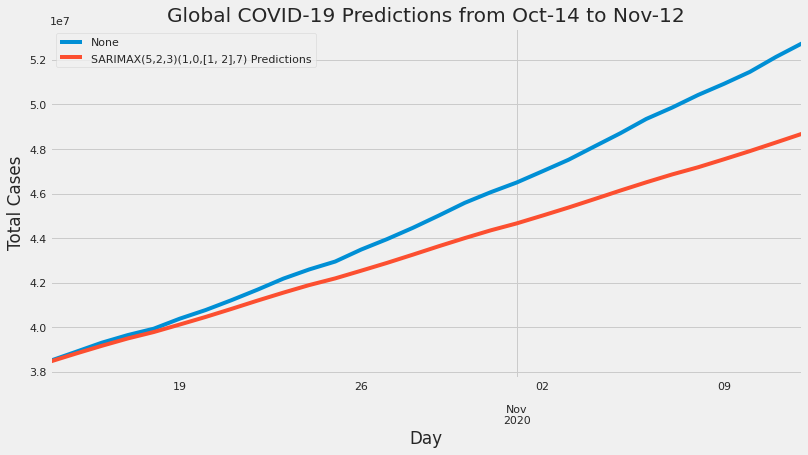

In [ ]:
title = 'Global COVID-19 Predictions from Oct-14 to Nov-12'
ylabel='Total Cases'
xlabel='Day'

ax = Global_test.plot(legend=True,figsize=(12,6),title=title)
global_preds.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

### Evaluating the model

In [ ]:
from sklearn.metrics import mean_squared_error

error = mean_squared_error(Global_test, global_preds)
print(f'SARIMAX(5, 2, 3)x(1, 0, [1, 2], 7) MSE Error: {error:11.10}')

SARIMAX(5, 2, 3)x(1, 0, [1, 2], 7) MSE Error: 3.996058123e+12


## Weekly Forecasting

In [ ]:
Global = time_series[:].sum()
Global_train = Global[:(len(Global.index)-7)]
Global_test = Global[(len(Global.index)-7):]

In [ ]:
def index_to_date(ser, f='D'):
    ser.index = pd.to_datetime(ser.index)
    ser.index.freq = f

In [ ]:
index_to_date(Global)

In [ ]:
index_to_date(Global_train)

In [ ]:
Global_train

2020-01-22         555
2020-01-23         654
2020-01-24         941
2020-01-25        1434
2020-01-26        2118
                ...   
2020-11-01    46494219
2020-11-02    47001076
2020-11-03    47514619
2020-11-04    48112246
2020-11-05    48705471
Freq: D, Length: 289, dtype: int64

In [ ]:
index_to_date(Global_test)

In [ ]:
auto_arima(Global_train, start_p=1, max_p=15, start_q=1, max_q=15, seasonal=True, maxiter=3000, m=7).summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  289
Model:             SARIMAX(2, 2, 2)x(1, 0, [1], 7)   Log Likelihood               -3203.852
Date:                             Fri, 13 Nov 2020   AIC                           6421.705
Time:                                     18:22:44   BIC                           6447.321
Sample:                                          0   HQIC                          6431.972
                                             - 289                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2976      0.430      0.693      0.489      -0.545       1.140
ar.L2         -0.2612      0.126     -2.071      0.038      -0.508      -0.014
ma.L1         -1.0176      0.439     -2.320      0.020      -1.878      -0.158
ma.L2          0.3807      0.314      1.211      0.226      -0.235       0.997
ar.S.L7        0.9698      0.030     32.779      0.000       0.912       1.028
ma.S.L7       -0.4821      0.077     -6.283      0.000      -0.632      -0.332
sigma2      4.734e+08   1.56e-09   3.04e+17      0.000    4.73e+08    4.73e+08
===================================================================================
Ljung-Box (Q):                       68.96   Jarque-Bera (JB):               439.36
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):              16.40   Skew:                             0.74
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.63e+33. Standard errors may be unstable.
"""

This provides an ARIMA Order of (2,2,2) combined with a seasonal order of (1,0,[1],7) Now let's train & test the SARIMAX(2,2,2)(1,0,[1],7) model, evaluate it, then produce a forecast of future values.

#### Fitting the model

In [ ]:
model = SARIMAX(global_df['Values'],order=(2,2,2),seasonal_order=(1,0,[1],7))
results = model.fit()
results.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                              Values   No. Observations:                  266
Model:             SARIMAX(2, 2, 2)x(1, 0, [1], 7)   Log Likelihood               -2876.379
Date:                             Fri, 13 Nov 2020   AIC                           5766.757
Time:                                     18:22:45   BIC                           5791.789
Sample:                                 01-22-2020   HQIC                          5776.816
                                      - 10-13-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4845      0.598      0.810      0.418      -0.688       1.657
ar.L2         -0.1380      0.116     -1.190      0.234      -0.365       0.089
ma.L1         -1.1800      0.617     -1.911      0.056      -2.390       0.030
ma.L2          0.4180      0.429      0.974      0.330      -0.423       1.259
ar.S.L7        0.9690      0.025     38.523      0.000       0.920       1.018
ma.S.L7       -0.6002      0.088     -6.822      0.000      -0.773      -0.428
sigma2      2.497e+08   1.68e-09   1.49e+17      0.000     2.5e+08     2.5e+08
===================================================================================
Ljung-Box (Q):                       65.17   Jarque-Bera (JB):               155.26
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               9.14   Skew:                             0.68
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.50
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.07e+33. Standard errors may be unstable.
"""

#### Predicting the results

In [ ]:
start=len(Global_train)
end=len(Global_train)+len(Global_test)-1
global_preds = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMAX(2,2,2)(1,0,[1],7) Predictions')

In [ ]:
global_preds

2020-11-06    4.669833e+07
2020-11-07    4.707254e+07
2020-11-08    4.740063e+07
2020-11-09    4.777466e+07
2020-11-10    4.814971e+07
2020-11-11    4.854549e+07
2020-11-12    4.895465e+07
Freq: D, Name: SARIMAX(2,2,2)(1,0,[1],7) Predictions, dtype: float64

In [ ]:
Global_test

2020-11-06    49346623
2020-11-07    49858197
2020-11-08    50423019
2020-11-09    50923663
2020-11-10    51460740
2020-11-11    52126793
2020-11-12    52733290
Freq: D, dtype: int64

In [ ]:
#Root mean squared error of the predictions with actual data
from statsmodels.tools.eval_measures import rmse

error = rmse(Global_test, global_preds)
print(f'SARIMAX(2,2,2)(1,0,[1],7) RMSE Error: {error:11.10}')

SARIMAX(2,2,2)(1,0,[1],7) RMSE Error: 3204710.928


#### Plotting the results

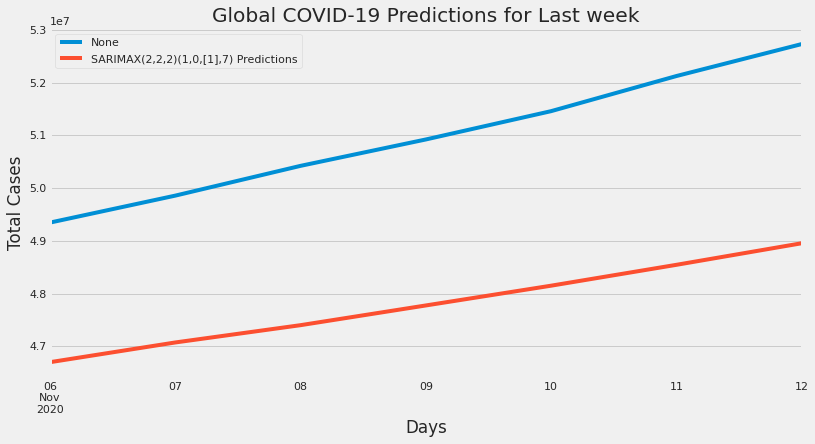

In [ ]:
title = 'Global COVID-19 Predictions for Last week'
ylabel='Total Cases'
xlabel='Days'

ax = Global_test.plot(legend=True,figsize=(12,6),title=title)
global_preds.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

This model gives poor results on monthly forecasting, hence we will use weekly forecasting

In [ ]:
model = SARIMAX(Global,order=(2,2,2),seasonal_order=(1,0,[1],7))
results = model.fit()
results.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  296
Model:             SARIMAX(2, 2, 2)x(1, 0, [1], 7)   Log Likelihood               -3313.906
Date:                             Fri, 13 Nov 2020   AIC                           6641.812
Time:                                     18:22:46   BIC                           6667.597
Sample:                                 01-22-2020   HQIC                          6652.138
                                      - 11-12-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1380      0.589     -0.234      0.815      -1.291       1.016
ar.L2         -0.1964      0.107     -1.834      0.067      -0.406       0.013
ma.L1         -0.7014      0.589     -1.190      0.234      -1.856       0.454
ma.L2          0.0973      0.415      0.234      0.815      -0.717       0.911
ar.S.L7        0.9332      0.038     24.488      0.000       0.859       1.008
ma.S.L7       -0.2970      0.076     -3.889      0.000      -0.447      -0.147
sigma2      5.539e+08   2.62e-10   2.11e+18      0.000    5.54e+08    5.54e+08
===================================================================================
Ljung-Box (Q):                       56.13   Jarque-Bera (JB):               695.33
Prob(Q):                              0.05   Prob(JB):                         0.00
Heteroskedasticity (H):              20.45   Skew:                            -0.15
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number  5e+34. Standard errors may be unstable.
"""

#### Plotting

In [ ]:
start=len(Global)
end=len(Global)+len(Global_test)-1 #7 days into the future
final_preds = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMAX(2,2,2)(1,0,[1],7) Predictions')

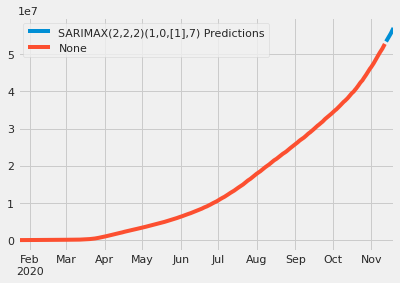

In [ ]:
final_preds.plot(legend=True)
Global.plot(legend=True)

## Monthly and Weekly forecasting in India

## Weekly

#### Adjusting the indices

In [ ]:
India = time_series.loc['India']
India_train = India[:(len(Global.index)-7)]
India_test = India[(len(Global.index)-7):]

In [ ]:
index_to_date(India)

In [ ]:
India.isnull().sum()

0

In [ ]:
index_to_date(India_train)
index_to_date(India_test)

#### Augmented Dickey Fuller test on the Indian train set

In [ ]:
adf_test(India_train)

Augmented Dickey-Fuller Test: 
ADF test statistic        1.261145
p-value                   0.996382
# lags used              16.000000
# observations          272.000000
critical value (1%)      -3.454622
critical value (5%)      -2.872225
critical value (10%)     -2.572464
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


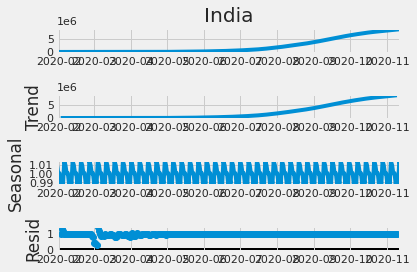

In [ ]:
result = seasonal_decompose(India[India>0], model='mul')
result.plot();
#Trend, Seasonal, Residuals

In [ ]:
auto_arima(India_train,exogenous=None, start_p=1, max_p=15, start_q=1, max_q=15, seasonal=True, maxiter=3000, m=7).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  289
Model:             SARIMAX(2, 2, 0)x(1, 0, [1], 7)   Log Likelihood               -2646.377
Date:                             Fri, 13 Nov 2020   AIC                           5302.755
Time:                                     18:23:48   BIC                           5321.052
Sample:                                          0   HQIC                          5310.088
                                             - 289                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5459      0.042    -12.856      0.000      -0.629      -0.463
ar.L2         -0.2138      0.051     -4.231      0.000      -0.313      -0.115
ar.S.L7        0.9583      0.023     41.915      0.000       0.913       1.003
ma.S.L7       -0.5488      0.048    -11.531      0.000      -0.642      -0.456
sigma2      6.148e+06   2.97e+05     20.694      0.000    5.57e+06    6.73e+06
===================================================================================
Ljung-Box (Q):                       97.64   Jarque-Bera (JB):              3080.54
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):             413.11   Skew:                             1.50
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
model = SARIMAX(India_train,order=(2,2,0),seasonal_order=(1,0,[1],7))
results = model.fit()
results.summary()

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               India   No. Observations:                  289
Model:             SARIMAX(2, 2, 0)x(1, 0, [1], 7)   Log Likelihood               -2651.312
Date:                             Fri, 13 Nov 2020   AIC                           5312.624
Time:                                     18:23:50   BIC                           5330.921
Sample:                                 01-22-2020   HQIC                          5319.957
                                      - 11-05-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6460      0.033    -19.535      0.000      -0.711      -0.581
ar.L2         -0.1737      0.044     -3.904      0.000      -0.261      -0.086
ar.S.L7        0.9890      0.010     99.705      0.000       0.970       1.008
ma.S.L7       -0.6037      0.033    -18.039      0.000      -0.669      -0.538
sigma2      6.148e+06   2.01e-09   3.06e+15      0.000    6.15e+06    6.15e+06
===================================================================================
Ljung-Box (Q):                       97.21   Jarque-Bera (JB):              1844.80
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):             426.29   Skew:                             1.23
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 3.44e+30. Standard errors may be unstable.
"""

#### Forecasting for 7 days

In [ ]:
start=len(India_train)
end=len(India_train)+len(India_test)-1 #7 days into the future
final_preds = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMAX(2,2,0)x(1,0,[1],7) Predictions')

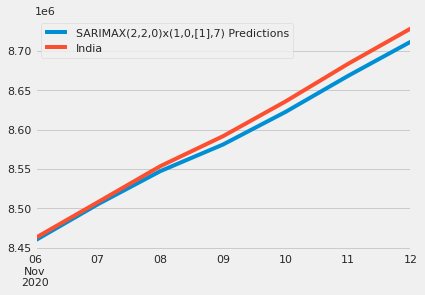

In [ ]:
final_preds.plot(legend=True)
India_test.plot(legend=True)

In [ ]:
error = rmse(India_test, final_preds)
print(f'SARIMAX(2,2,0)(1,0,[1],7) RMSE Error: {error:11.10}')

SARIMAX(2,2,0)(1,0,[1],7) RMSE Error: 11090.61971


#### Fitting on entire data

In [ ]:
auto_arima(India, start_p=1, max_p=15, start_q=1, max_q=15, seasonal=True, maxiter=3000, m=7).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  296
Model:             SARIMAX(0, 2, 2)x(1, 0, [1], 7)   Log Likelihood               -2709.525
Date:                             Fri, 13 Nov 2020   AIC                           5429.051
Time:                                     18:24:41   BIC                           5447.469
Sample:                                          0   HQIC                          5436.427
                                             - 296                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5636      0.038    -14.889      0.000      -0.638      -0.489
ma.L2          0.1400      0.043      3.294      0.001       0.057       0.223
ar.S.L7        0.9557      0.022     43.972      0.000       0.913       0.998
ma.S.L7       -0.5393      0.045    -12.009      0.000      -0.627      -0.451
sigma2      5.779e+06    2.5e+05     23.097      0.000    5.29e+06    6.27e+06
===================================================================================
Ljung-Box (Q):                      103.37   Jarque-Bera (JB):              2639.38
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):             404.86   Skew:                             1.36
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
model = SARIMAX(India,order=(0,2,2),seasonal_order=(1,0,[1],7))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               India   No. Observations:                  296
Model:             SARIMAX(0, 2, 2)x(1, 0, [1], 7)   Log Likelihood               -2709.525
Date:                             Fri, 13 Nov 2020   AIC                           5429.051
Time:                                     18:24:42   BIC                           5447.469
Sample:                                 01-22-2020   HQIC                          5436.427
                                      - 11-12-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5636      0.038    -14.889      0.000      -0.638      -0.489
ma.L2          0.1400      0.043      3.294      0.001       0.057       0.223
ar.S.L7        0.9557      0.022     43.972      0.000       0.913       0.998
ma.S.L7       -0.5393      0.045    -12.009      0.000      -0.627      -0.451
sigma2      5.779e+06    2.5e+05     23.097      0.000    5.29e+06    6.27e+06
===================================================================================
Ljung-Box (Q):                      103.37   Jarque-Bera (JB):              2639.38
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):             404.86   Skew:                             1.36
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
start=len(India)
end=len(India)+len(India_test)-1 #7 days into the future
final_preds = results.predict(start=start, end=end, dynamic=False, typ='levels').rename('SARIMAX(0,2,2)x(1,0,[1],7) Predictions')

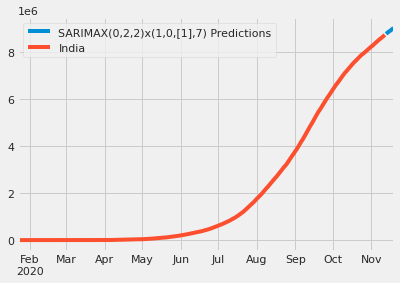

In [ ]:
final_preds.plot(legend=True)
India.plot(legend=True)